## Advanced Regression Assignment
- By Sabyasachi Parida

# Problem Statement

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

 The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

The company wants to know:

- Which variables are significant in predicting the price of a house, and
- How well those variables describe the price of a house.

## Business Goal 
You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for management to understand the pricing dynamics of a new market.

## Major Steps To be carried out 
1. Read and inspect the data 
2. Data cleaning and Outlier analysis 
3. Data Prep for Modeling
4. Test Train Split
5. Model Building
6. Conclusion

##  1. Read and inspect the data 

In [1]:
## Importing basic libraries 

import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

import warnings 
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib.pyplot as plt

import seaborn as sns
from scipy import stats
from scipy.stats import norm

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
## Import the data 
HouseDf = pd.read_csv(r"D:\Data Science\Study material\UpGrad\Generalised Linear regression\Assignment\train.csv")
Final=HouseDf ## Keeping a colp which I'll use at the end 
HouseDf.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
HouseDf.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [4]:
HouseDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

### Inferences

- Total rows : 1460
- Total Columns : 81

In [5]:
colnames=(HouseDf.isnull().sum()/len(HouseDf))
colnames = list(colnames[colnames.values > 0].index)
colnames

['LotFrontage',
 'Alley',
 'MasVnrType',
 'MasVnrArea',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Electrical',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PoolQC',
 'Fence',
 'MiscFeature']

The above are columns which have null values .

## 2. Data Preparation,Cleaning,EDA and Outlier analysis 

In [6]:
## Creating a User defined function to remove nulls
def removeNulls(dataframe , axis=1, percentage=0.3):
    '''
    it will remove rows or columns based on the input provided 
    dataframe = name of dataframe 
    axis =1 default for columns , if rows are required we would need to pass 0 
    
    default percentage check is 30%
    
    '''
    df= dataframe.copy()
    ishape = df.shape
    if axis==0:
        rownames= df.transpose().isnull().sum()
        rownames= list(rownames[rownames.values > percentage*len(df)].index)
        print(rownames)
        df.drop(df.index[rownames],inplace=True)
        print("\nNumber of Rows dropped\t: ",len(rownames))
    else:
        colnames=(df.isnull().sum()/len(df))
        colnames = list(colnames[colnames.values>=percentage].index)
        print(colnames)
        df.drop(labels = colnames,axis =1,inplace=True)   
        print("\nNumber of Columns dropped\t: ",len(colnames))
    
    print("\nPrevious Shape -",ishape,"\nNew Shape",df.shape)
    return df

## 2.1 Data Preparation as per Data dictionary 

While inspecting the data_description.txt we observed that there are multiple columns where NA doesnt really mean null . For eg - Alley: Type of alley access to property

       Grvl	Gravel
       Pave	Paved
       NA 	No alley access

We will replace the NA in such cases with the actual value.

In [7]:
## Creating a mapper for NA values as per the data dictionary 
Mapper = {'Alley': 'NoAlley', 'BsmtQual': 'NoBasement', 'BsmtCond': 'NoBasement', 'BsmtExposure': 'NoBasement',
          'BsmtFinType1': 'NoBasement', 'BsmtFinType2': 'NoBasement', 'FireplaceQu' : 'NoFireplace',
          'GarageType': 'NoGarage', 'GarageFinish': 'NoGarage', 'GarageQual': 'NoGarage', 'GarageCond': 'NoGarage',
          'PoolQC': 'NoPool', 'Fence': 'NoFence'}

In [8]:
## Mapping the values as per the mapper 

HouseDf = HouseDf.fillna(value=Mapper)

In [9]:
## Checking the value counts 
for i in Mapper:
    print(HouseDf[i].value_counts(dropna=False,normalize=True))

NoAlley    0.937671
Grvl       0.034247
Pave       0.028082
Name: Alley, dtype: float64
TA            0.444521
Gd            0.423288
Ex            0.082877
NoBasement    0.025342
Fa            0.023973
Name: BsmtQual, dtype: float64
TA            0.897945
Gd            0.044521
Fa            0.030822
NoBasement    0.025342
Po            0.001370
Name: BsmtCond, dtype: float64
No            0.652740
Av            0.151370
Gd            0.091781
Mn            0.078082
NoBasement    0.026027
Name: BsmtExposure, dtype: float64
Unf           0.294521
GLQ           0.286301
ALQ           0.150685
BLQ           0.101370
Rec           0.091096
LwQ           0.050685
NoBasement    0.025342
Name: BsmtFinType1, dtype: float64
Unf           0.860274
Rec           0.036986
LwQ           0.031507
NoBasement    0.026027
BLQ           0.022603
ALQ           0.013014
GLQ           0.009589
Name: BsmtFinType2, dtype: float64
NoFireplace    0.472603
Gd             0.260274
TA             0.214384
Fa    

## 2.2 Check and Remove columns having high null Values 

In [10]:
## Check the columns which has null values 

colnames=(HouseDf.isnull().sum()/len(HouseDf))
colnames = list(colnames[colnames.values > 0.1].index)
colnames

['LotFrontage', 'MiscFeature']

The  above are the Columns which have more than 10% null values .
I will go ahead and delete these values as they wont add much value to the analysis 

In [11]:
## Remove the columns having null value as per my assumptions
HouseDf= removeNulls(HouseDf,1,0.1)
HouseDf.info()


['LotFrontage', 'MiscFeature']

Number of Columns dropped	:  2

Previous Shape - (1460, 81) 
New Shape (1460, 79)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 79 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-nu

In [12]:
## Describe and check the dataset 
HouseDf.describe()

,Id,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [13]:
# Creating derived features
# Converting dates (YearBuilt, YearRemodAdd, GarageYrBlt) to days (DiffYearBuilt, DiffYearRemodAdd, DiffGarageYrBlt) from today
HouseDf['DiffYearBuilt'] = pd.datetime.now().year - HouseDf['YearBuilt']
HouseDf['DiffYearRemodAdd'] = pd.datetime.now().year - HouseDf['YearRemodAdd']
HouseDf['DiffGarageYrBlt'] = pd.datetime.now().year - HouseDf['GarageYrBlt']

In [14]:
## Dropping the Actual columns after we got the derived columns 
HouseDf.drop(columns=['YearBuilt','YearRemodAdd','GarageYrBlt'],inplace=True)

In [15]:
colnames=(HouseDf.isnull().sum()/len(HouseDf))
colnames = list(colnames[colnames.values > 0].index)
colnames

['MasVnrType', 'MasVnrArea', 'Electrical', 'DiffGarageYrBlt']

In [16]:
## The above 4 columns have nullvalues 
Catval =['MasVnrType', 'Electrical']
NumVal=['MasVnrArea','DiffGarageYrBlt']

Lets Impute the null values with the help of SKLearn 

In [17]:
## Imputing with Mode

from sklearn.impute import SimpleImputer 
catimp = SimpleImputer(missing_values=np.nan, strategy='most_frequent') 
HouseDf[Catval]= catimp.fit_transform(HouseDf[Catval])

In [18]:
## Impute with Median

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
it = IterativeImputer( initial_strategy='median') 
HouseDf[NumVal]= it.fit_transform(HouseDf[NumVal])

## 2.2 Data preparation for EDA

In [19]:
# Separating numerical and categorical fields for analysisng them separately using the Data Dictionary 
##(https://cdn.upgrad.com/UpGrad/temp/87f67e28-c47e-4725-ae3c-111142c7eaba/data_description.txt).

# OUTCOME COLUMN:
out_col = 'SalePrice'

# NUMERICAL COLUMNS: 
num_col = ['LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 
           'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
           'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 
           'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'DiffYearBuilt', 'DiffYearRemodAdd',
           'DiffGarageYrBlt']
print(len(num_col))

# CATEGORICAL COLUMNS: 
cat_col = ['Alley','MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
           'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
           'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 
           'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating',
           'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 
           'GarageQual', 'GarageCond','PoolQC', 'Fence','PavedDrive', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition']
print(len(cat_col))



30
46


## 2.3 Exploratory Data Analysis

In [20]:
def variate(df,cols,vartype): 
    '''
    Univariate function will plot the graphs based on the parameters.
    df      : dataframe name
    col     : Column name
    vartype := 1 for numerical 2 Categorical
    '''
    plt.figure(figsize=(50, 300))
    sns.set(style="darkgrid")
    if vartype==1:
        
        index=1
        for col in cols:
            plt.subplot(13, 3, index)
            plt.title(col,fontsize=50)
            plt.tick_params(labelsize =40)
            sns.distplot(df[col],color='navy')
            index= index+1
    else :
        index=1
        for vals in cols:
            plt.subplot(24, 2, index)
            plt.title(vals,fontsize=50)
            plt.tick_params(labelsize = 40)
            HouseDf[vals].value_counts().plot(kind='bar',rot=-35,color='turquoise',legend=True,grid=True);
            index= index+1


    
    plt.show()

### 2.3.1 Univariate analysis for Numerical Columns

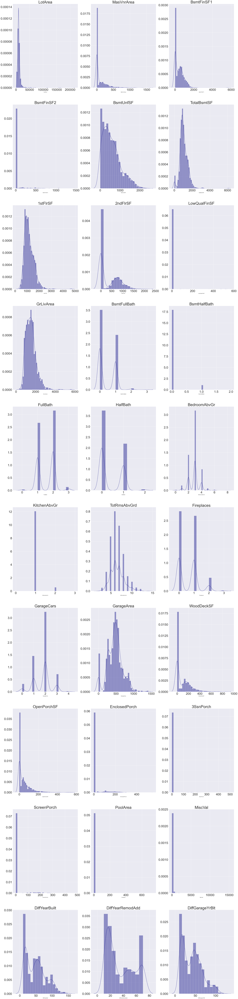

In [21]:
## Univariate analysis for numerical columns 
variate(HouseDf,num_col,1)

### Inferences
1.  The following Columns have highly skewed data amd wont be of much help to our analysis .
   - BsmtFinSF2
   - KitchenAbvGr
   - LowQualFinSF
   - 3SSnPorch
   - ScreenPorch
   - PoolArea
   - MiscVal
   and few more ...
 lets check the skewness of the columns 
 The  Acceptable value of Skewness fall between -3 and 3 . Source :- https://www.sciencedirect.com/topics/neuroscience/kurtosis
 

In [22]:
SKewed=[]
for cols in num_col:
    print(cols +': ' +str(HouseDf[cols].skew()))
    if HouseDf[cols].skew()>3 or HouseDf[cols].skew() <-3:
        SKewed.append(cols)

LotArea: 12.207687851233496
MasVnrArea: 2.671018036221348
BsmtFinSF1: 1.685503071910789
BsmtFinSF2: 4.255261108933303
BsmtUnfSF: 0.9202684528039037
TotalBsmtSF: 1.5242545490627664
1stFlrSF: 1.3767566220336365
2ndFlrSF: 0.8130298163023265
LowQualFinSF: 9.011341288465387
GrLivArea: 1.3665603560164552
BsmtFullBath: 0.596066609663168
BsmtHalfBath: 4.103402697955168
FullBath: 0.036561558402727165
HalfBath: 0.675897448233722
BedroomAbvGr: 0.21179009627507137
KitchenAbvGr: 4.488396777072859
TotRmsAbvGrd: 0.6763408364355531
Fireplaces: 0.6495651830548841
GarageCars: -0.3425489297486655
GarageArea: 0.17998090674623907
WoodDeckSF: 1.5413757571931312
OpenPorchSF: 2.3643417403694404
EnclosedPorch: 3.08987190371177
3SsnPorch: 10.304342032693112
ScreenPorch: 4.122213743143115
PoolArea: 14.828373640750588
MiscVal: 24.476794188821916
DiffYearBuilt: 0.6134611724881861
DiffYearRemodAdd: 0.5035620027004843
DiffGarageYrBlt: 0.6448351205309916


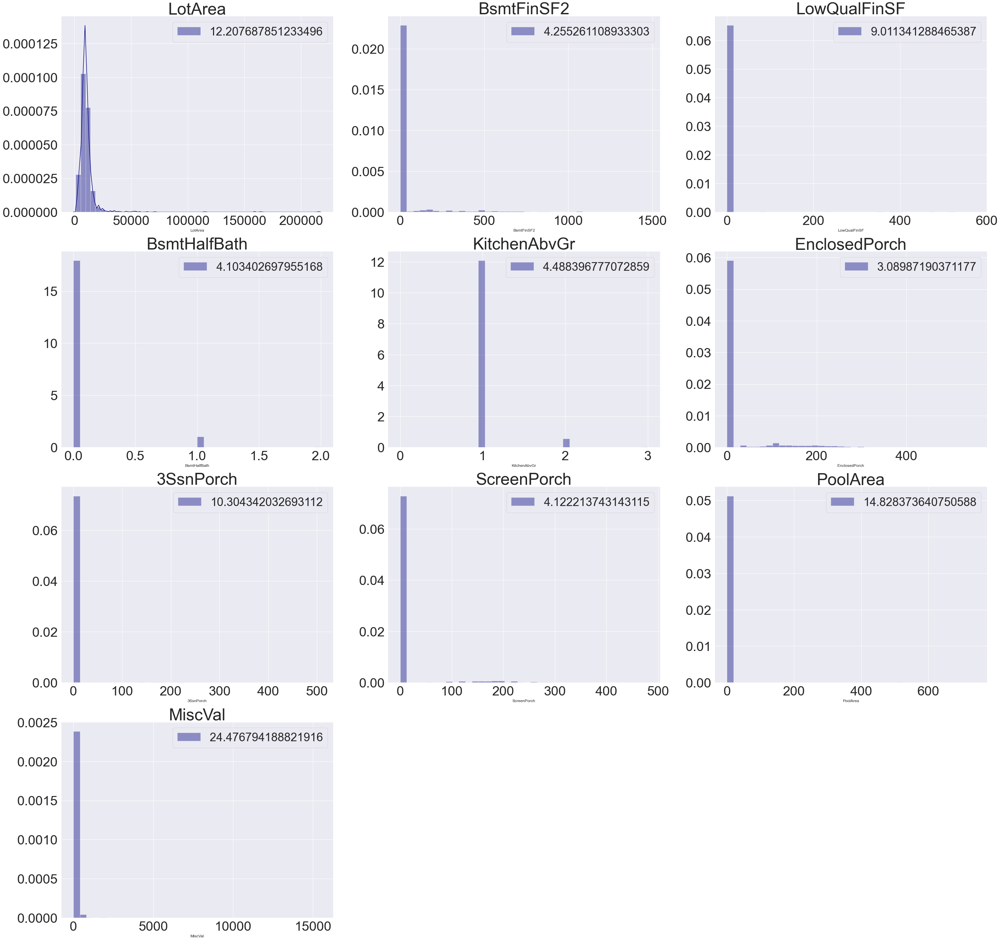

In [23]:
##plotting the highly skewed columns

plt.figure(figsize=(50, 50))
sns.set(style="darkgrid")
index=1
for col in SKewed:
    plt.subplot(4, 3, index)
    plt.title(col,fontsize=50)
    plt.tick_params(labelsize =40)
    sns.distplot(HouseDf[col],color='navy')
    plt.legend([HouseDf[col].skew()], loc='upper right',fontsize=35)
    index= index+1
plt.show();

### Inferences and actions 
As they are highly skewed we will go ahead and delete them from our dataframe .


In [24]:
## Checking the shape 
print("Before Deleting : "+ str(HouseDf.shape))
HouseDf.drop(SKewed, axis=1,inplace=True)
print("After Deleting : "+ str(HouseDf.shape))


Before Deleting : (1460, 79)
After Deleting : (1460, 69)


In [25]:
## Deleting the Skewed values from the numerical column list
num_col = [ele for ele in num_col if ele not in SKewed]
num_col

['MasVnrArea',
 'BsmtFinSF1',
 'BsmtUnfSF',
 'TotalBsmtSF',
 '1stFlrSF',
 '2ndFlrSF',
 'GrLivArea',
 'BsmtFullBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'WoodDeckSF',
 'OpenPorchSF',
 'DiffYearBuilt',
 'DiffYearRemodAdd',
 'DiffGarageYrBlt']

### 2.3.2 Univariate analysis for Categorical Columns

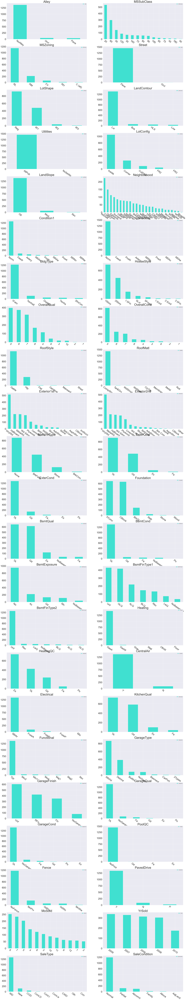

In [26]:
## Univariate analysis of Categorical Columns 
variate(HouseDf,cat_col ,2)

### Inferences

- Most of them have no Alley
- In case of MSSubclass 20 has the heighest frequence
- In Case of MSzoning RL has the heighest counts
- In case of Street Pave has almost 98% counts
- In case of LOT shape Reg has the heighest value Counts
- Land Contour has Lvl as heighest frequency
- In case of Utilities AllPub has heighest frequence
- In Case of LotConfig we have Inside which has heighest frequecy and so on ..


The case of following Columns maximum rows have same value.

- Alley
- Street
- Utilities
- Condition2
- RoofMatl
- Heating

We will proceed and will segrigate the values i.e will put those values which are less than 5% into a single group

In [27]:
## Lets segrigate the values which are less than 5% to one single group
def Segrigate (Val,threshold =0.05):
    
    HouseDf[Val].value_counts(dropna=False,normalize=True)
    plt.figure(figsize=(5, 5))
    count_df= HouseDf[Val].value_counts(dropna=False,normalize=True)
    count_df=count_df.to_frame()
    count_df=count_df[count_df[Val]<threshold]
    to_replace= count_df.index
    to_replace
    HouseDf[Val] = HouseDf[Val].replace(to_replace, 'Others')
    HouseDf[Val].value_counts(dropna=False,normalize=True).plot(kind='bar',color='turquoise',legend=True,fontsize=11,grid=True);

In [28]:
len(cat_col)

46

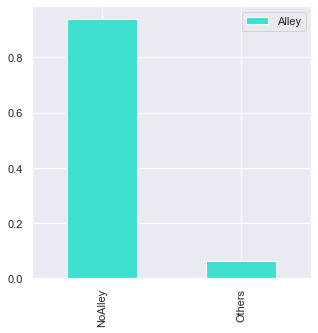

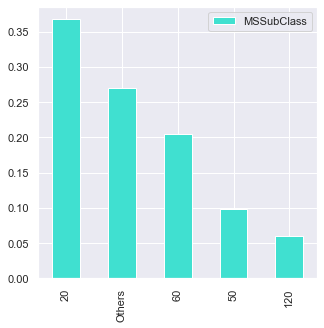

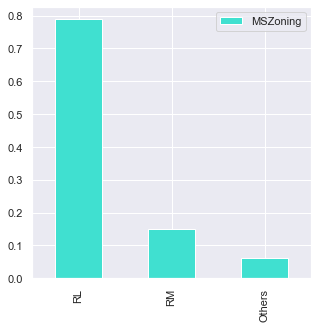

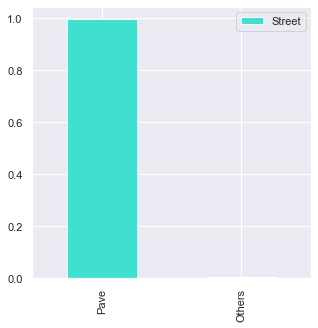

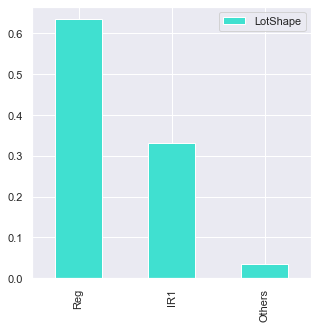

...

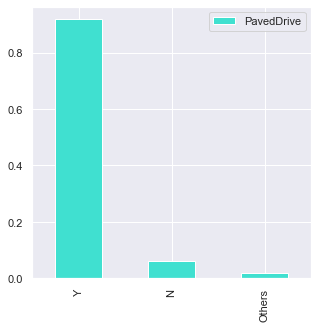

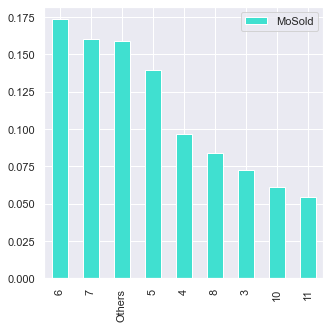

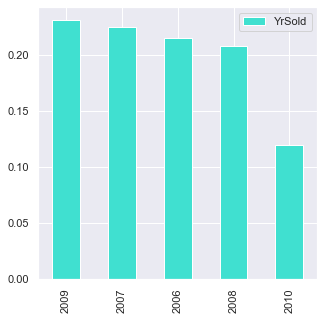

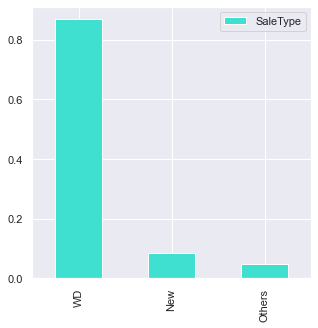

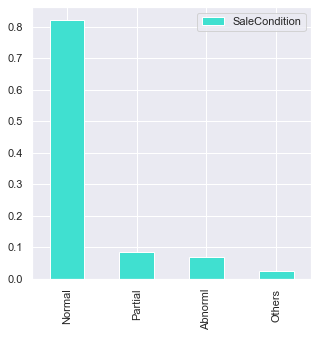

In [29]:
for val in cat_col:
    Segrigate(val)

### Inferences 

After segrigation we can see that for following columns more than 95% values represent the same value

- Alley
- Street
- Utilities
- Condition2
- RoofMatl
- Heating
- Functional
- PoolQC

We will delete these columns as they will not add much value to our analysis as most of the values are same .



In [30]:
# Creating the list
Freq_Values = ['Alley','Street', 'Utilities','Condition2','RoofMatl','Heating','Functional','PoolQC']

# Deleting the Freq_Values
cat_col = [ele for ele in cat_col if ele not in Freq_Values]
cat_col

['MSSubClass',
 'MSZoning',
 'LotShape',
 'LandContour',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'Fence',
 'PavedDrive',
 'MoSold',
 'YrSold',
 'SaleType',
 'SaleCondition']

In [31]:
## Checking the shape droping and checking the shape again to observe the number of columns dropped 
HouseDf.shape
HouseDf.drop(Freq_Values, axis=1,inplace=True)
HouseDf.shape

(1460, 69)

(1460, 61)

In [32]:
## Inspecting the datapase 
HouseDf.head()

,Id,MSSubClass,MSZoning,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,Fence,MoSold,YrSold,SaleType,SaleCondition,SalePrice,DiffYearBuilt,DiffYearRemodAdd,DiffGarageYrBlt
0,1,60,RL,Reg,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,150,856,Ex,Y,SBrkr,856,854,1710,1,2,1,3,Gd,8,0,NoFireplace,Attchd,RFn,2,548,TA,TA,Y,0,61,NoFence,Others,2008,WD,Normal,208500,17,17,17.0
1,2,20,RL,Reg,Lvl,Others,Gtl,Others,Feedr,1Fam,1Story,6,Others,Gable,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,284,1262,Ex,Y,SBrkr,1262,0,1262,0,2,0,3,TA,6,1,TA,Attchd,RFn,2,460,TA,TA,Y,298,0,NoFence,5,2007,WD,Normal,181500,44,44,44.0
2,3,60,RL,IR1,Lvl,Inside,Gtl,CollgCr,Norm,1Fam,2Story,7,5,Gable,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,434,920,Ex,Y,SBrkr,920,866,1786,1,2,1,3,Gd,6,1,TA,Attchd,RFn,2,608,TA,TA,Y,0,42,NoFence,Others,2008,WD,Normal,223500,19,18,19.0
3,4,Others,RL,IR1,Lvl,Corner,Gtl,Others,Norm,1Fam,2Story,7,5,Gable,Wd Sdng,Others,None,0.0,TA,TA,BrkTil,TA,Others,No,ALQ,216,Unf,540,756,Gd,Y,SBrkr,961,756,1717,1,1,0,3,Gd,7,1,Gd,Detchd,Unf,3,642,TA,TA,Y,0,35,NoFence,Others,2006,WD,Abnorml,140000,105,50,22.0
4,5,60,RL,IR1,Lvl,Others,Gtl,Others,Norm,1Fam,2Story,8,5,Gable,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,490,1145,Ex,Y,SBrkr,1145,1053,2198,1,2,1,4,Gd,9,1,TA,Attchd,RFn,3,836,TA,TA,Y,192,84,NoFence,Others,2008,WD,Normal,250000,20,20,20.0


## 2.4 Bivariate Analysis 

<Figure size 432x288 with 0 Axes>

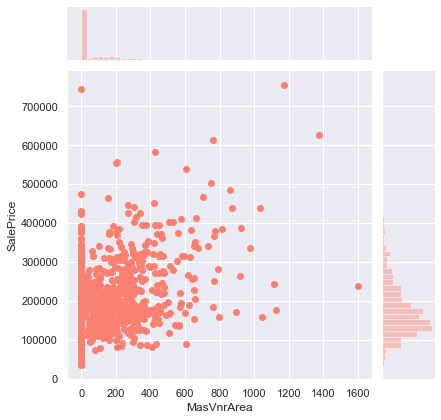

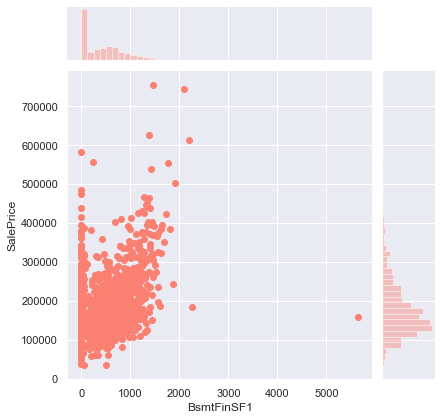

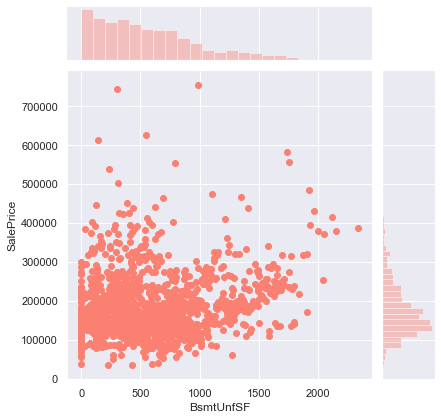

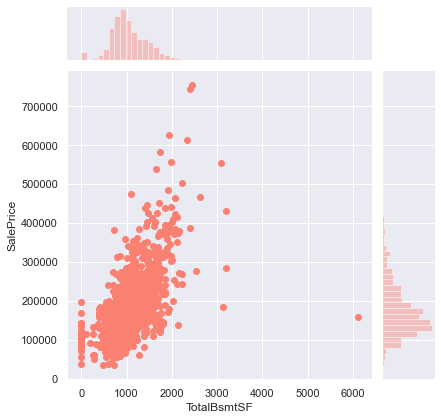

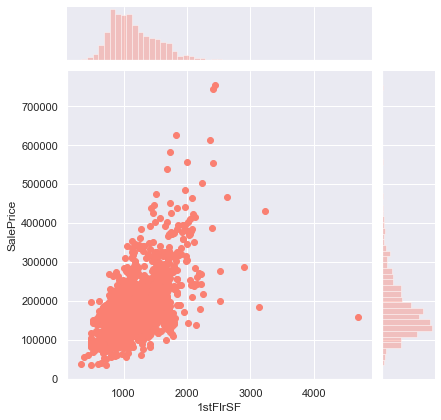

...

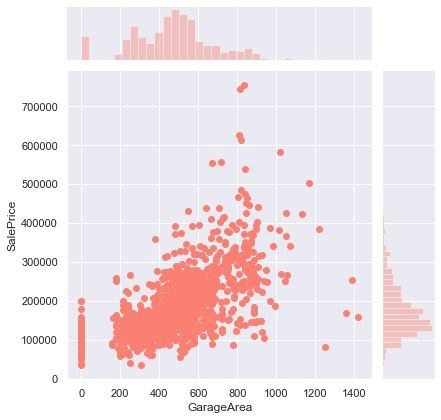

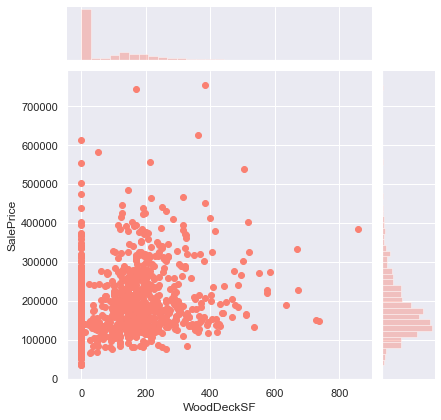

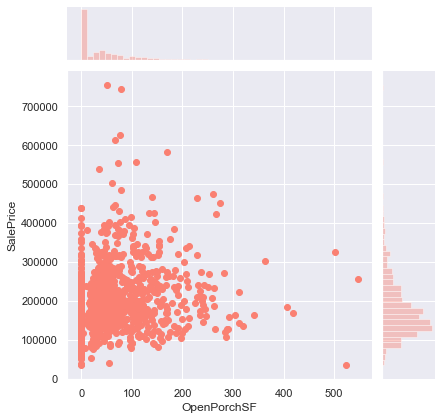

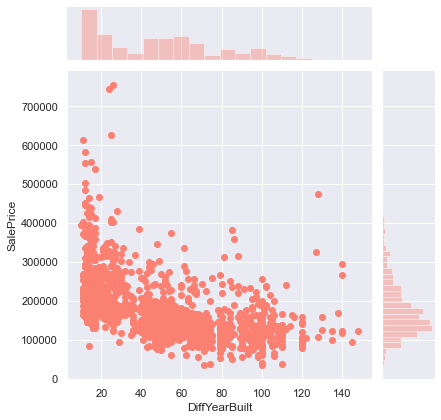

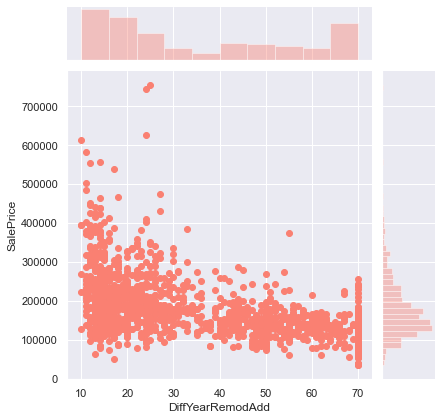

<Figure size 432x288 with 0 Axes>

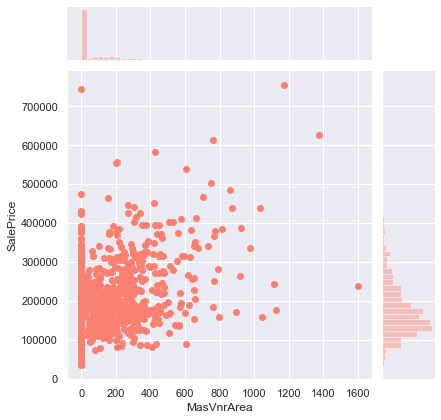

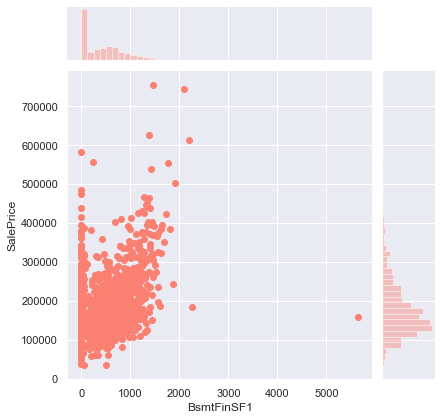

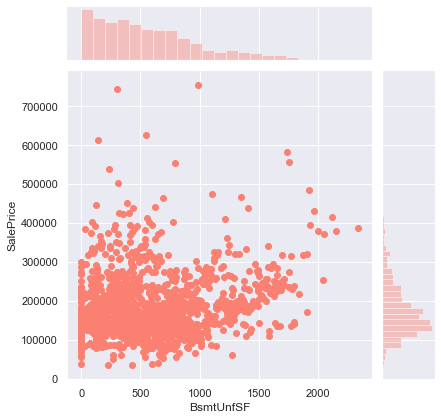

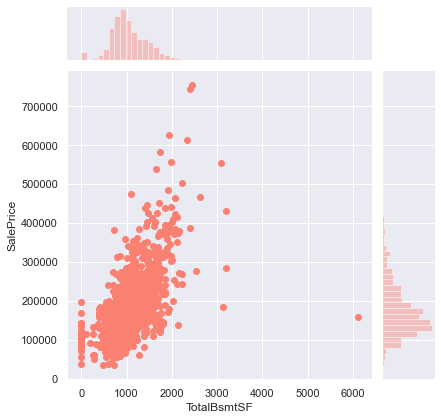

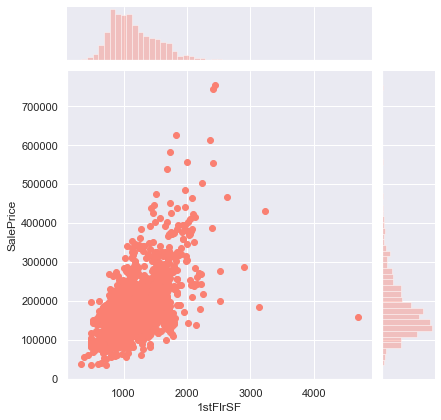

...

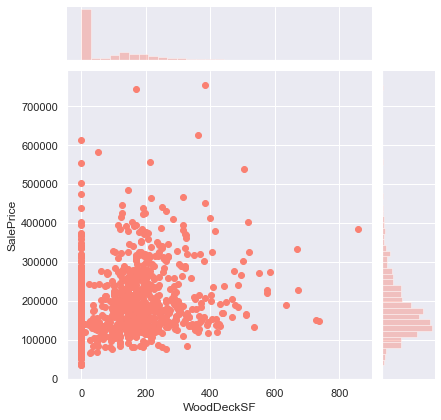

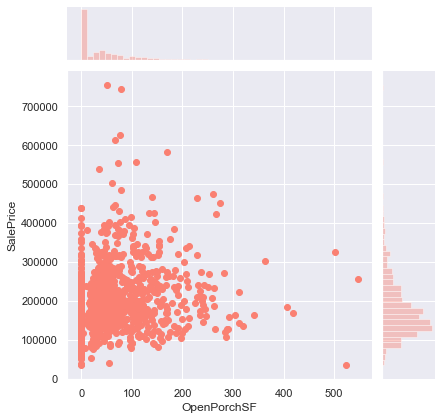

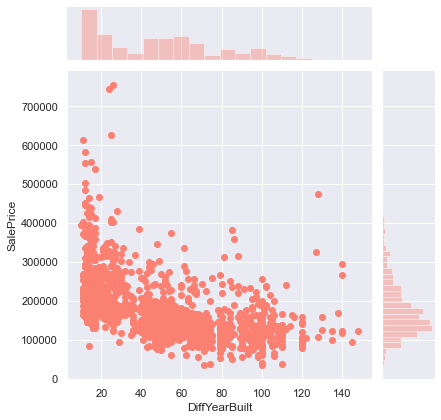

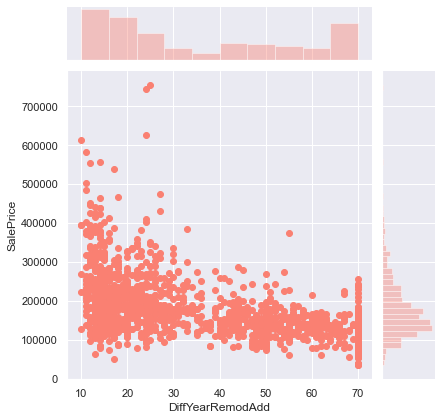

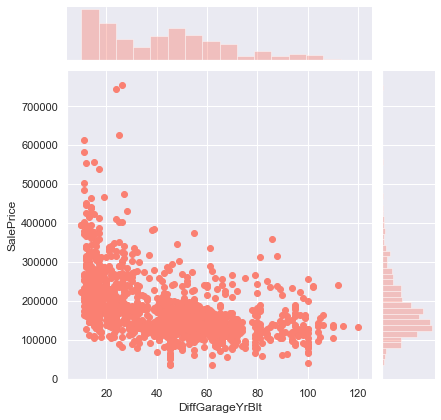

In [33]:
## Plotting the numerical variables W.r.t Sales price
sns.set(style="darkgrid")
index=1
for col in num_col:
    plt.figure(index)
    sns.jointplot(x= col,y=out_col,data=HouseDf[[col,out_col]],color='salmon');
    index= index+1

#### Inferences
- In case of MasVnrArea vs salesprice we can observer many have 0 Masvnsarea but have high sales price 
- Same is the case of BsmtFinSF1
- The bsmtuntsf spreads in the range of 0-200 and it has few datapoints which are having less Bsuntsf but High price
- There seems to be a linear relationship between TotalBsmtsf and Salesprice . There also exist some outliers.
- In case of 1stflrSF with increase in 1stFlrSF value the value of salesprice are also increasing, there exists some linear relationship among them as well.
- 2ndflrSf has a lot value as 0 which measns thereare no 2ndfloor for them .
- the sales price seems to have a linear relationship with GrLivArea.
- The BasemtFullBath has maximum values as 0 which measn many dont have that .Same is the case with HalfBath
- BedroomAbvGr has a value at 8 and most have 2,3,4 as their value
- Salesprice incereases with Garage area as well .
- Cannot visualize and infer much about the diffyearBuilt and few other variables 


In [34]:
def cat_bivariate(i, col_i,col_o,df_data):
    plt.figure(i)
    variables = df_data[[col_i]].nunique()
    plt.figure(figsize=(variables,variables/1.77))
    my_order = df_data[[col_i,col_o]].groupby(by=[col_i])[col_o].median().sort_values(ascending=True)
    sns.boxplot(x=col_i, y=col_o, data=df_data[[col_i,col_o]], order=my_order.index,palette='magma')

<Figure size 432x288 with 0 Axes>

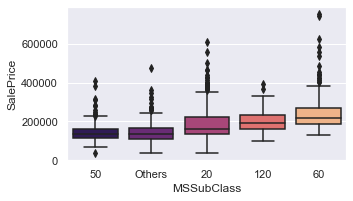

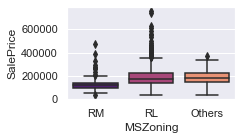

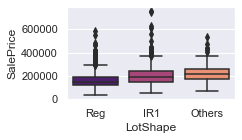

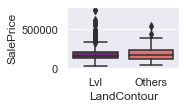

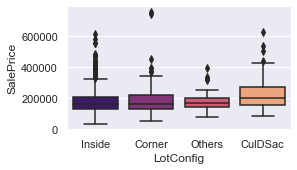

...

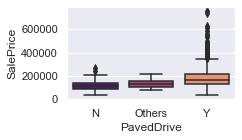

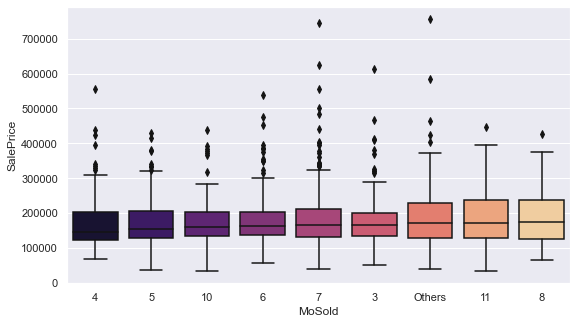

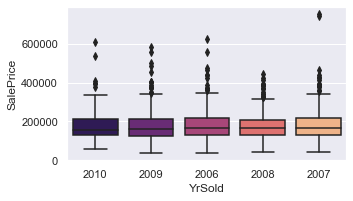

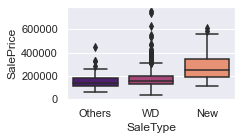

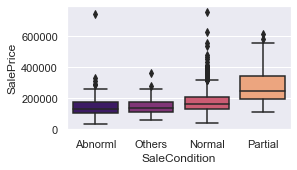

In [35]:
for i, col in enumerate(cat_col):
    cat_bivariate(i,col,out_col,HouseDf)

#### Inferences 
- MsSubclass 60 seems to have heigher Median value
- LotConfig CulDsac seems to have higher median value
- Neighbourhood Nridght seems to have the heighest median value.
- BsmtExposure Gd seems to have heigher median value.
- BsmtFinType1 has higher GLQ median value.
- HeatingQC Ex has heighest median value.
- KitchenQual ex has the Heighest median value.
- GarageType Bulitin seems to have heighest median value .
- SaleCondition Partial seems to have heigh median value.


## 2.5 Visualizing Coorelation

<Figure size 1440x1440 with 0 Axes>

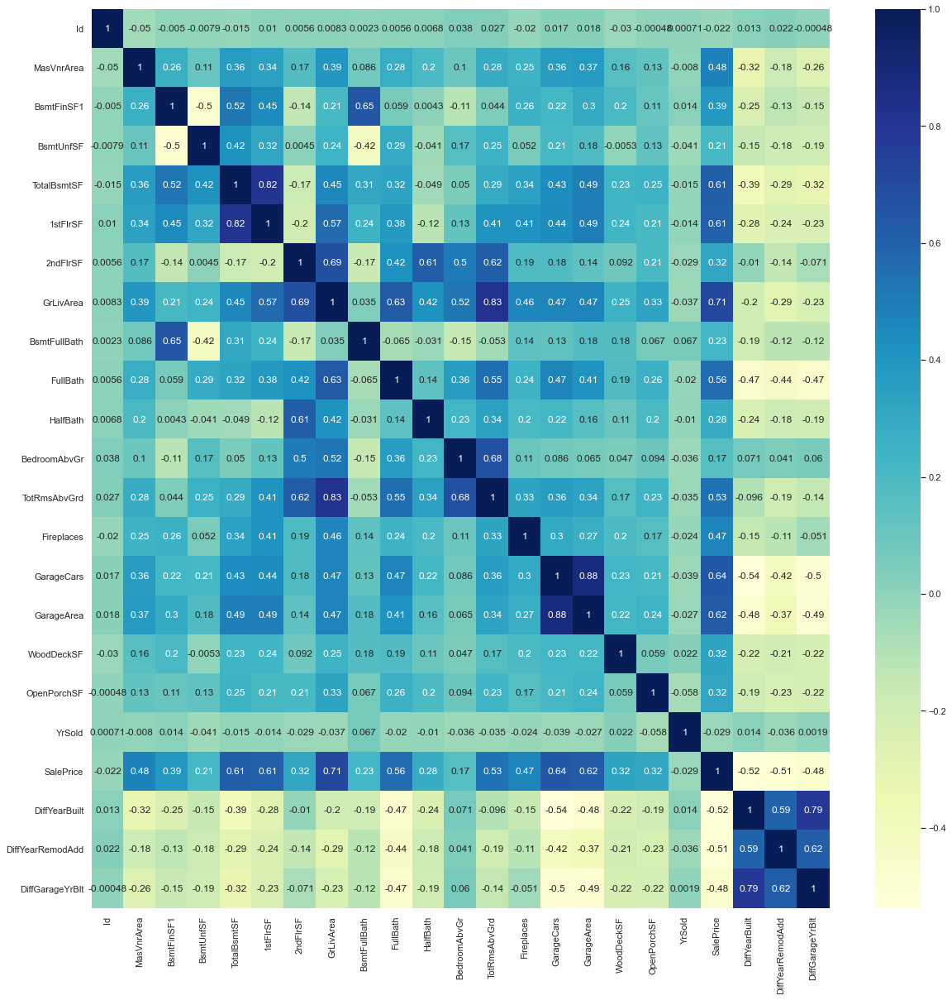

In [36]:
plt.figure(figsize=(20,20))
sns.heatmap(HouseDf.corr(), cmap="YlGnBu", annot=True)
plt.show()

#### Inferences 

There seem be few highly coorelated pairs like 
- DiffGarageyrBuilt vs DiffYearBuilt
- GrLivArea vs totalRoomsavbGrd 
- Garage cars and Garage area and so on .

## 2.6 Outlier Analysis 

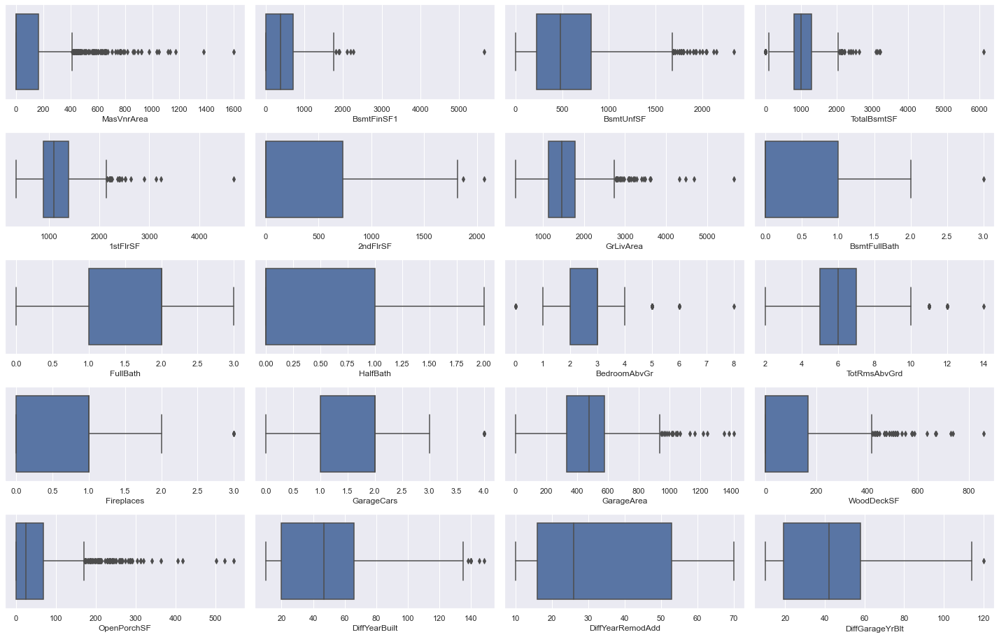

In [37]:
cnt=0
plt.figure(figsize = (20,25))

for i in num_col:
    plt.subplot(10,4,cnt+1)
    sns.boxplot(HouseDf[i])
    cnt += 1
plt.tight_layout()    
plt.show();


As defined by Gladwell as people who do not fit into our normal understanding of achievement. 
Outliers deals with exceptional people, especially those who are smart, rich, and successful, and those who operate at the extreme outer edge of what is statistically plausible. An outlier is a data point that is distant from other similar points. They may be due to variability in the measurement or may indicate experimental errors . - Source Kaggle 

#### Inferences 
Apart from the DiffYear Built I dont observe any other outlier that might seem to be unresonable.
Hence will keep those records which has age less than 140 yrs

In [38]:
## Removing the rows as per the outlier analysis 
HouseDf=HouseDf[HouseDf['DiffYearBuilt']<140]

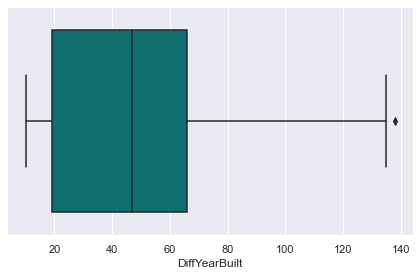

In [39]:
sns.boxplot(HouseDf['DiffYearBuilt'],color='teal')
plt.tight_layout()    
plt.show();

## 2.7 Observing the Distribution of both Dependent aswell as independent variable

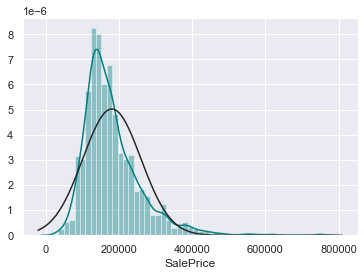

In [40]:
## Checking the target variable's distribution
sns.distplot(HouseDf['SalePrice'], fit=norm,color='teal');

We can observer Positive skewness.


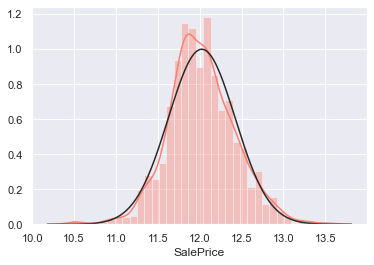

In [41]:
## Plotting by applying the log transform to the sales price 
sns.distplot(np.log(HouseDf['SalePrice']), fit=norm,color='salmon');

In [42]:
##It doesnt appear to be skewed now. so lets transform that now
HouseDf['SalePrice'] = np.log(HouseDf['SalePrice'])

In [43]:
from sklearn.preprocessing import PowerTransformer

# power transform for getting data more gausian like 

pt = PowerTransformer(method='yeo-johnson', standardize=True)
HouseDf[num_col] = pt.fit_transform(HouseDf[num_col])

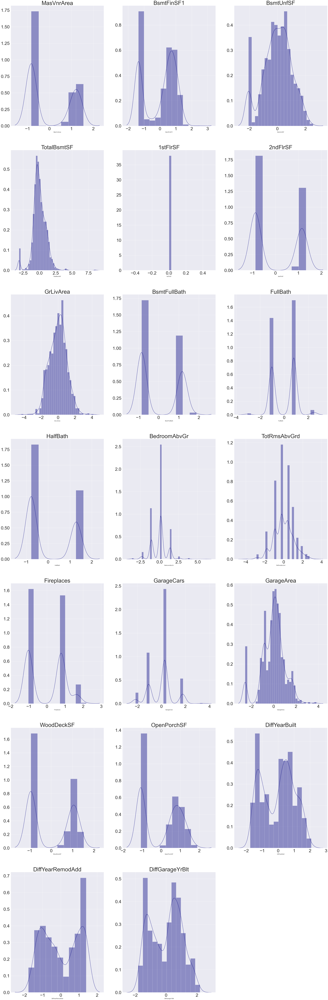

In [44]:
variate(HouseDf,num_col,1)

 It more or less looks more gaussian than the raw data

## 3.Data Prep for Modeling

There are some ordinal categorial colums in our data set.If we go ahead and use panda's dummification the ordinal weight will get lost.hence we will use LabelEncoder. It also will help us get rid of numerous dummy columns 

## 3.1 Label Encoding

In [45]:
## Using Label encoding for ordinal categorical variables 

from sklearn.preprocessing import LabelEncoder
Weighted_Cat = ['ExterQual','ExterCond','BsmtQual','BsmtExposure','BsmtFinType1','BsmtFinType2','HeatingQC','KitchenQual',
'FireplaceQu','GarageQual','Fence']
HouseDf[Weighted_Cat].head()

,ExterQual,ExterCond,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,KitchenQual,FireplaceQu,GarageQual,Fence
0,Gd,TA,Gd,No,GLQ,Unf,Ex,Gd,NoFireplace,TA,NoFence
1,TA,TA,Gd,Gd,ALQ,Unf,Ex,TA,TA,TA,NoFence
2,Gd,TA,Gd,Mn,GLQ,Unf,Ex,Gd,TA,TA,NoFence
3,TA,TA,TA,No,ALQ,Unf,Gd,Gd,Gd,TA,NoFence
4,Gd,TA,Gd,Av,GLQ,Unf,Ex,Gd,TA,TA,NoFence


In [46]:
## Encoading the Weighted_Cat
for cols in Weighted_Cat:
    LE=LabelEncoder()
    LE.fit(list(HouseDf[cols].values))
    HouseDf[cols]=LE.transform(list(HouseDf[cols].values))
HouseDf[Weighted_Cat].head()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

LabelEncoder()

,ExterQual,ExterCond,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinType2,HeatingQC,KitchenQual,FireplaceQu,GarageQual,Fence
0,0,2,1,3,2,1,0,1,3,2,1
1,2,2,1,1,0,1,0,3,5,2,1
2,0,2,1,2,2,1,0,1,5,2,1
3,2,2,3,3,0,1,1,1,2,2,1
4,0,2,1,0,2,1,0,1,5,2,1


In [47]:
# Taking info 
HouseDf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1454 entries, 0 to 1459
Data columns (total 61 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Id                1454 non-null   int64  
 1   MSSubClass        1454 non-null   object 
 2   MSZoning          1454 non-null   object 
 3   LotShape          1454 non-null   object 
 4   LandContour       1454 non-null   object 
 5   LotConfig         1454 non-null   object 
 6   LandSlope         1454 non-null   object 
 7   Neighborhood      1454 non-null   object 
 8   Condition1        1454 non-null   object 
 9   BldgType          1454 non-null   object 
 10  HouseStyle        1454 non-null   object 
 11  OverallQual       1454 non-null   object 
 12  OverallCond       1454 non-null   object 
 13  RoofStyle         1454 non-null   object 
 14  Exterior1st       1454 non-null   object 
 15  Exterior2nd       1454 non-null   object 
 16  MasVnrType        1454 non-null   object 


## 3.2 Creating Dummy variables 

In [48]:
# Creating dummies with pandas inbuilt get_dummies funtion
HouseDf = pd.get_dummies(HouseDf, drop_first=True)
HouseDf.head()

,Id,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageCars,GarageArea,GarageQual,WoodDeckSF,OpenPorchSF,Fence,YrSold,SalePrice,DiffYearBuilt,DiffYearRemodAdd,DiffGarageYrBlt,MSSubClass_50,MSSubClass_60,MSSubClass_120,MSSubClass_Others,MSZoning_RL,MSZoning_RM,LotShape_Others,LotShape_Reg,LandContour_Others,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Others,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Others,Neighborhood_Sawyer,Neighborhood_Somerst,Condition1_Norm,Condition1_Others,BldgType_Others,BldgType_TwnhsE,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_5,OverallQual_6,OverallQual_7,OverallQual_8,OverallQual_Others,OverallCond_6,OverallCond_7,OverallCond_Others,RoofStyle_Hip,RoofStyle_Others,Exterior1st_MetalSd,Exterior1st_Others,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior2nd_MetalSd,Exterior2nd_Others,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,MasVnrType_None,MasVnrType_Others,MasVnrType_Stone,Foundation_CBlock,Foundation_Others,Foundation_PConc,BsmtCond_TA,CentralAir_Y,Electrical_Others,Electrical_SBrkr,GarageType_BuiltIn,GarageType_Detchd,GarageType_NoGarage,GarageType_Others,GarageFinish_NoGarage,GarageFinish_RFn,GarageFinish_Unf,GarageCond_Others,GarageCond_TA,PavedDrive_Others,PavedDrive_Y,MoSold_4,MoSold_5,MoSold_6,MoSold_7,MoSold_8,MoSold_10,MoSold_11,MoSold_Others,SaleType_Others,SaleType_WD,SaleCondition_Normal,SaleCondition_Others,SaleCondition_Partial
0,1,1.212733,0,2,1,3,2,0.793940,1,-0.883665,-0.404325,0,0.0,1.175712,0.534380,1.171121,0.798753,1.281673,0.173835,1,0.950609,-1.02872,3,0.272828,0.382861,2,-0.951411,0.839400,1,2008,12.247694,-1.171422,-0.877819,-1.124550,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0
1,2,-0.830260,2,2,1,1,0,1.009732,1,-0.430373,0.506962,0,0.0,-0.867356,-0.380166,-0.841779,0.798753,-0.775102,0.173835,3,-0.230399,0.78155,5,0.272828,-0.008079,2,1.213261,-1.072908,1,2007,12.109011,0.097747,0.678093,0.328761,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,1,0,0,0,0,0,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0
2,3,1.174226,0,2,1,2,2,0.566004,1,-0.044166,-0.254236,0,0.0,1.178327,0.665564,1.171121,0.798753,1.281673,0.173835,1,-0.230399,0.78155,5,0.272828,0.642655,2,-0.951411,0.665628,1,2008,12.317167,-1.038609,-0.781480,-0.969439,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0
3,4,-0.830260,2,2,3,3,0,0.134441,1,0.187128,-0.644855,1,0.0,1.152666,0.546701,1.171121,-1.026231,-0.775102,0.173835,1,0.394360,0.78155,2,1.776542,0.787735,2,-0.951411,0.581552,1,2006,11.849398,1.549949,0.878420,-0.759065,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0
4,5,1.320330,0,2,1,0,2,0.746565,1,0.081340,0.253425,0,0.0,1.214472,1.292700,1.171121,0.798753,1.281673,1.389246,1,1.452337,0.78155,5,1.776542,1.590616,2,1.078762,0.989901,1,2008,12.429216,-0.976017,-0.604689,-0.896602,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0


In [49]:
# Checking the shape
HouseDf.shape

(1454, 117)

## 4. Test Train Split

In [50]:
from sklearn.model_selection import train_test_split

In [51]:
## Creating X and y

X = HouseDf.drop(out_col, axis=1)
X_Id = X.pop('Id')
y = HouseDf[out_col]
X.shape, y.shape

((1454, 115), (1454,))

In [52]:
## Train test split 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((1163, 115), (291, 115), (1163,), (291,))

## 5. Model Building

In [53]:
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE

In [54]:
 # running RFE to get top 25 variables 
lm = LinearRegression(normalize=True)
rfe = RFE(lm, 25, verbose =3)            
rfe = rfe.fit(X_train, y_train)

Fitting estimator with 115 features.
Fitting estimator with 114 features.
Fitting estimator with 113 features.
Fitting estimator with 112 features.
Fitting estimator with 111 features.
Fitting estimator with 110 features.
Fitting estimator with 109 features.
Fitting estimator with 108 features.
Fitting estimator with 107 features.
Fitting estimator with 106 features.
Fitting estimator with 105 features.
Fitting estimator with 104 features.
Fitting estimator with 103 features.
Fitting estimator with 102 features.
Fitting estimator with 101 features.
Fitting estimator with 100 features.
Fitting estimator with 99 features.
Fitting estimator with 98 features.
Fitting estimator with 97 features.
Fitting estimator with 96 features.
Fitting estimator with 95 features.
Fitting estimator with 94 features.
Fitting estimator with 93 features.
Fitting estimator with 92 features.
Fitting estimator with 91 features.
Fitting estimator with 90 features.
Fitting estimator with 89 features.
Fitting esti

In [55]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('MasVnrArea', False, 84),
 ('ExterQual', False, 87),
 ('ExterCond', False, 82),
 ('BsmtQual', False, 52),
 ('BsmtExposure', False, 55),
 ('BsmtFinType1', False, 89),
 ('BsmtFinSF1', False, 13),
 ('BsmtFinType2', False, 76),
 ('BsmtUnfSF', False, 69),
 ('TotalBsmtSF', False, 51),
 ('HeatingQC', False, 77),
 ('1stFlrSF', False, 27),
 ('2ndFlrSF', False, 21),
 ('GrLivArea', True, 1),
 ('BsmtFullBath', False, 45),
 ('FullBath', False, 46),
 ('HalfBath', False, 53),
 ('BedroomAbvGr', False, 68),
 ('KitchenQual', False, 35),
 ('TotRmsAbvGrd', False, 67),
 ('Fireplaces', False, 47),
 ('FireplaceQu', False, 63),
 ('GarageCars', False, 6),
 ('GarageArea', False, 37),
 ('GarageQual', False, 15),
 ('WoodDeckSF', False, 79),
 ('OpenPorchSF', False, 66),
 ('Fence', False, 91),
 ('YrSold', False, 75),
 ('DiffYearBuilt', False, 81),
 ('DiffYearRemodAdd', False, 9),
 ('DiffGarageYrBlt', False, 80),
 ('MSSubClass_50', True, 1),
 ('MSSubClass_60', True, 1),
 ('MSSubClass_120', False, 7),
 ('MSSubClass

In [56]:
## get the top 25 column names into a list fet_col
fet_col= X_train.columns[rfe.support_]
fet_col

Index(['GrLivArea', 'MSSubClass_50', 'MSSubClass_60', 'MSSubClass_Others', 'MSZoning_RL', 'LotConfig_CulDSac', 'Neighborhood_Edwards', 'Neighborhood_NAmes', 'Neighborhood_NWAmes', 'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_Sawyer', 'Neighborhood_Somerst', 'HouseStyle_Others', 'OverallQual_8', 'OverallQual_Others', 'MasVnrType_Others', 'Foundation_Others', 'BsmtCond_TA', 'CentralAir_Y', 'GarageCond_TA', 'SaleType_Others', 'SaleType_WD', 'SaleCondition_Normal', 'SaleCondition_Partial'], dtype='object')

## 5.1. Looking into Model parameters via Stats model

In [57]:
## Using Stats model to get a better understanding via the stats model table

X_train_top25 = X_train[fet_col]
X_train_top25 = sm.add_constant(X_train_top25)
lm = sm.OLS(y_train,X_train_top25).fit()
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.831
Model:                            OLS   Adj. R-squared:                  0.827
Method:                 Least Squares   F-statistic:                     223.3
Date:                Mon, 02 Nov 2020   Prob (F-statistic):               0.00
Time:                        01:12:06   Log-Likelihood:                 455.38
No. Observations:                1163   AIC:                            -858.8
Df Residuals:                    1137   BIC:                            -727.2
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    11.9746      0.171     69.901      0.000      11.639      12.311
GrLivArea                 0.2320      0.006     36.626      0.000       0.220       0.244
MSSubClass_50            -0.2368      0.019    -12.745      0.000      -0.273      -0.200
MSSubClass_60            -0.0980      0.015     -6.427      0.000      -0.128      -0.068
MSSubClass_Others        -0.1941      0.016    -11.894      0.000      -0.226      -0.162
MSZoning_RL               0.1138      0.017      6.879      0.000       0.081       0.146
LotConfig_CulDSac         0.0906      0.020      4.431      0.000       0.050       0.131
Neighborhood_Edwards     -0.1537      0.020     -7.576      0.000      -0.194      -0.114
Neighborhood_NAmes       -0.1323      0.016     -8.502      0.000      -0.163      -0.102
Neighborhood_NWAmes      -0.0886      0.023     -3.921      0.000      -0.133      -0.044
Neighborhood_NridgHt      0.1512      0.025      6.106      0.000       0.103       0.200
Neighborhood_OldTown     -0.0671      0.022     -3.027      0.003      -0.111      -0.024
Neighborhood_Sawyer      -0.1644      0.024     -6.811      0.000      -0.212      -0.117
Neighborhood_Somerst      0.1490      0.025      6.069      0.000       0.101       0.197
HouseStyle_Others         0.1733      0.020      8.530      0.000       0.133       0.213
OverallQual_8             0.1462      0.017      8.467      0.000       0.112       0.180
OverallQual_Others        0.1630      0.023      6.969      0.000       0.117       0.209
MasVnrType_Others        -0.0839      0.045     -1.849      0.065      -0.173       0.005
Foundation_Others        -0.1328      0.035     -3.782      0.000      -0.202      -0.064
BsmtCond_TA               0.0688      0.018      3.928      0.000       0.034       0.103
CentralAir_Y              0.1878      0.023      8.180      0.000       0.143       0.233
GarageCond_TA             0.1206      0.020      6.125      0.000       0.082       0.159
SaleType_Others          -0.4586      0.168     -2.724      0.007      -0.789      -0.128
SaleType_WD              -0.3946      0.167     -2.366      0.018      -0.722      -0.067
SaleCondition_Normal      0.0972      0.018      5.404      0.000       0.062       0.132
SaleCondition_Partial    -0.2200      0.167     -1.320      0.187      -0.547       0.107
==============================================================================
Omnibus:                      200.672   Durbin-Watson:                   1.915
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              963.891
Skew:                          -0.717   Prob(JB):                    4.94e-210
Kurtosis:                       7.223   Cond. No.                         167.
==============================================================================

## 5.1.1. Checking for Multicollinearity

In [58]:
## Check the VIF 

from statsmodels.stats.outliers_influence import variance_inflation_factor
def get_VIF(v_df):
    vif = pd.DataFrame()
    vif['Features'] = v_df.columns
    vif['VIF'] = [variance_inflation_factor(v_df.values, i) for i in range(v_df.shape[1])]
    vif['VIF'] = round(vif['VIF'],2)
    vif = vif.sort_values(by = 'VIF', ascending = False)
    return(vif)

In [59]:
get_VIF(X_train_top25)

,Features,VIF
0,const,1247.06
23,SaleType_WD,137.27
25,SaleCondition_Partial,91.14
22,SaleType_Others,58.02
4,MSSubClass_Others,2.19
24,SaleCondition_Normal,1.98
5,MSZoning_RL,1.96
1,GrLivArea,1.70
3,MSSubClass_60,1.59
14,HouseStyle_Others,1.47


We can see a high vif for SaleType_WD,SaleCondition_Partial,SaleType_Others which means there exists multicollinearity 


we will now go ahead and try Ridge and Lasso regression inorder to deal with the issue of Multicollinearity .

## 5.2. Ridge Regression

In [60]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import KFold, GridSearchCV

## Assigning back the top 25 features here (as we aded a constant during the stats model)
X_train_top25 = X_train[fet_col]
X_train=X_train_top25
X_train.head()
X_test=X_test[fet_col]
X_train_top25.shape
X_test.shape

,GrLivArea,MSSubClass_50,MSSubClass_60,MSSubClass_Others,MSZoning_RL,LotConfig_CulDSac,Neighborhood_Edwards,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,HouseStyle_Others,OverallQual_8,OverallQual_Others,MasVnrType_Others,Foundation_Others,BsmtCond_TA,CentralAir_Y,GarageCond_TA,SaleType_Others,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
1153,-1.686831,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0
598,0.421193,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0
215,-0.442711,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0
135,0.484592,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0
816,-1.054497,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0


(1163, 25)

(291, 25)

In [61]:
## Finding the optimal hyperparameter with grid search CV
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                    4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000]}

ridge = Ridge()
folds = 5
model_cv = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            
model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 28 candidates, totalling 140 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 140 out of 140 | elapsed:    1.0s finished


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [62]:
## getting the best parameter and Score for Ridge 
model_cv.best_params_
model_cv.best_score_


{'alpha': 6.0}

-0.1229006461660536

In [63]:
## Putting the results into a dataframe 

cv_result_l = pd.DataFrame(model_cv.cv_results_)
cv_result_l['param_alpha'] = cv_result_l['param_alpha'].astype('float32')
cv_result_l.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.005386,1.849957e-03,0.003590,0.001196,0.0001,{'alpha': 0.0001},-0.123615,-0.120385,-0.116090,-0.134469,-0.122481,-0.123408,0.006098,23,-0.119437,-0.119886,-0.122046,-0.117139,-0.120522,-0.119806,0.001599
1,0.005386,4.890844e-04,0.003191,0.000399,0.0010,{'alpha': 0.001},-0.123615,-0.120385,-0.116090,-0.134468,-0.122481,-0.123408,0.006098,22,-0.119438,-0.119886,-0.122047,-0.117140,-0.120523,-0.119807,0.001599
2,0.004986,3.234067e-07,0.002992,0.000631,0.0100,{'alpha': 0.01},-0.123611,-0.120383,-0.116089,-0.134464,-0.122481,-0.123406,0.006097,21,-0.119447,-0.119886,-0.122057,-0.117149,-0.120532,-0.119814,0.001599
3,0.005785,7.466207e-04,0.003590,0.000489,0.0500,{'alpha': 0.05},-0.123596,-0.120374,-0.116083,-0.134449,-0.122482,-0.123397,0.006094,20,-0.119481,-0.119884,-0.122094,-0.117184,-0.120567,-0.119842,0.001600
4,0.004987,1.668867e-03,0.002793,0.000746,0.1000,{'alpha': 0.1},-0.123577,-0.120364,-0.116077,-0.134433,-0.122484,-0.123387,0.006090,19,-0.119513,-0.119882,-0.122129,-0.117218,-0.120602,-0.119869,0.001600


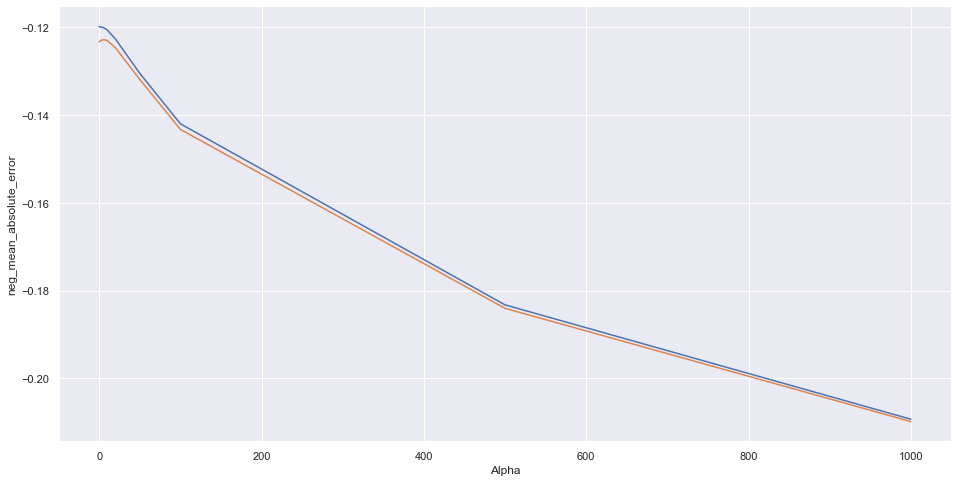

In [64]:
## Plotiing  Alpha vs negative mean square error 

plt.figure(figsize=(16,8))
plt.plot(cv_result_l['param_alpha'],cv_result_l['mean_train_score'])
plt.plot(cv_result_l['param_alpha'],cv_result_l['mean_test_score'])

plt.ylabel('neg_mean_absolute_error')
plt.xlabel('Alpha')
plt.show();

In [65]:
# Checking the best parameter(Alpha value)
Ridge_Alpha = model_cv.best_params_
Ridge_Alpha['alpha']

6.0

In [66]:
## Fitting with best parameter 
alpha = Ridge_Alpha['alpha']
ridge = Ridge(alpha=alpha)

ridge.fit(X_train, y_train)
ridge.coef_

Ridge(alpha=6.0)

array([ 0.23070132, -0.22046242, -0.08337824, -0.18031611,  0.10916297,
        0.08665453, -0.14149284, -0.12063854, -0.07484314,  0.14955021,
       -0.06797865, -0.14182138,  0.13840047,  0.15391857,  0.14767195,
        0.15162393, -0.06405571, -0.11202671,  0.0708196 ,  0.17782161,
        0.11962403, -0.11213092, -0.05623806,  0.08950852,  0.11370932])

In [67]:
## Checking  the r2 score 

from sklearn.metrics import r2_score
y_train_pred = ridge.predict(X_train)
Ridge_R2_Train =r2_score(y_true=y_train, y_pred=y_train_pred)
y_test_pred = ridge.predict(X_test)
Ridge_R2_Test= r2_score(y_true=y_test, y_pred=y_test_pred)
Ridge_R2_Train
Ridge_R2_Test

0.8292080946155551

0.8062497691406121

In [68]:
from sklearn.metrics import mean_squared_error
print ('RMSE for Test : ', mean_squared_error(y_test, y_test_pred))
print ('RMSE for Train: ', mean_squared_error(y_train, y_train_pred))

RMSE for Test :  0.03177983364442837
RMSE for Train:  0.0270035762117036


In [69]:
## Putting it into Datafram
ridge_coefficients = pd.DataFrame({'Feature Importance':ridge.coef_}, 
                           index=X_train.columns)
ridge_coefficients.sort_values('Feature Importance', ascending=False)

,Feature Importance
GrLivArea,0.230701
CentralAir_Y,0.177822
HouseStyle_Others,0.153919
OverallQual_Others,0.151624
Neighborhood_NridgHt,0.149550
OverallQual_8,0.147672
Neighborhood_Somerst,0.138400
GarageCond_TA,0.119624
SaleCondition_Partial,0.113709
MSZoning_RL,0.109163


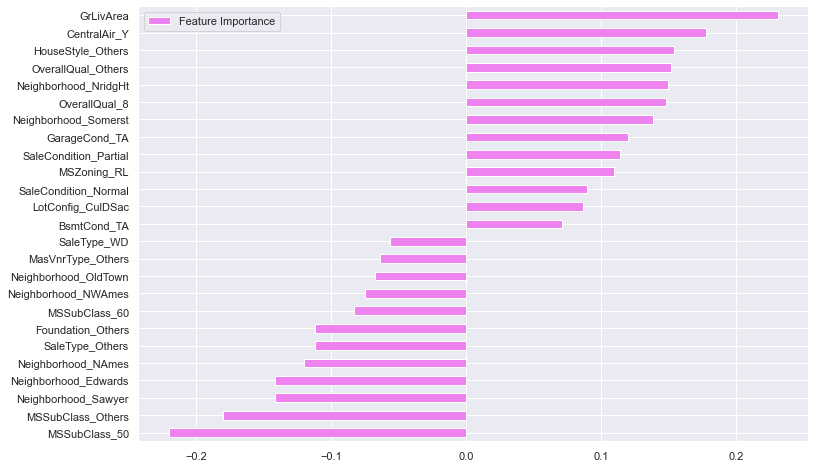

In [70]:
ridge_coefficients.sort_values('Feature Importance').plot(kind='barh',figsize=(12,8),color='violet')

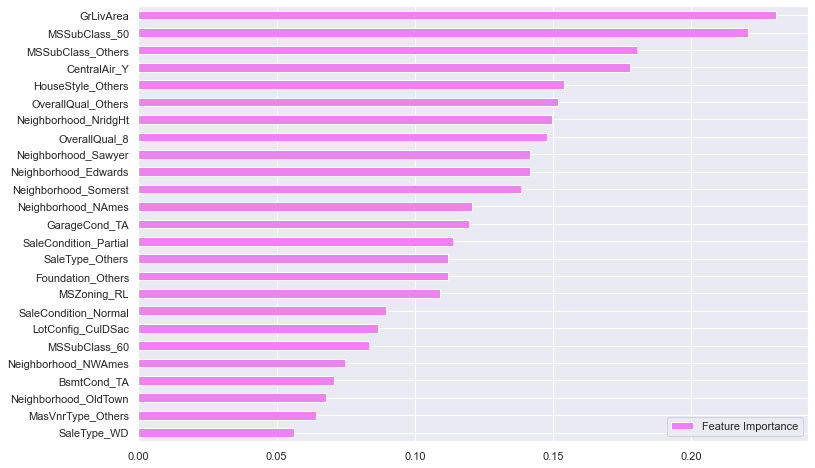

In [71]:
ridge_coefficients.abs().sort_values('Feature Importance').plot(kind='barh',figsize=(12,8),color='violet')

## 5.3. Lasso Regression

In [72]:
from sklearn.linear_model import Lasso
lasso = Lasso()
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                    4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 40,50,60,80, 100, 500, 1000]}
# cross validation
model_cv = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv.fit(X_train, y_train)

Fitting 5 folds for each of 31 candidates, totalling 155 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 155 out of 155 | elapsed:    1.1s finished


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 40,
                                   50, 60, 80, 100, 500, ...]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [73]:
Lasso_alpha = model_cv.best_params_
Lasso_alpha

{'alpha': 0.001}

In [74]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.004594,0.000795,0.002196,0.000398,0.0001,{'alpha': 0.0001},-0.123406,-0.120472,-0.116051,-0.134239,-0.122569,-0.123348,0.006012,2,-0.119604,-0.119840,-0.122227,-0.117323,-0.120724,-0.119944,0.001601
1,0.003400,0.000802,0.001393,0.000485,0.001,{'alpha': 0.001},-0.122481,-0.120703,-0.116439,-0.132933,-0.124078,-0.123327,0.005439,1,-0.120098,-0.120162,-0.122463,-0.117845,-0.121348,-0.120383,0.001538
2,0.002787,0.000396,0.001590,0.000496,0.01,{'alpha': 0.01},-0.149067,-0.156997,-0.149548,-0.165552,-0.157215,-0.155676,0.006048,3,-0.155347,-0.156487,-0.153928,-0.152880,-0.150830,-0.153894,0.001962
3,0.003192,0.000745,0.001995,0.000630,0.05,{'alpha': 0.05},-0.195253,-0.212157,-0.196764,-0.220985,-0.203410,-0.205714,0.009691,4,-0.208361,-0.203739,-0.208252,-0.201480,-0.205557,-0.205478,0.002647
4,0.002997,0.000640,0.001997,0.000635,0.1,{'alpha': 0.1},-0.203924,-0.222321,-0.206827,-0.234837,-0.205850,-0.214752,0.012000,5,-0.217972,-0.211986,-0.216670,-0.210363,-0.215419,-0.214482,0.002865


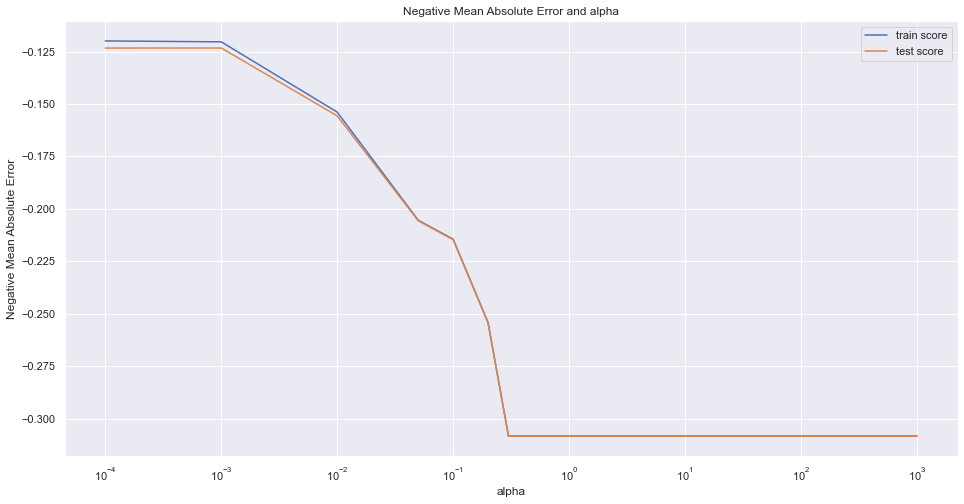

In [75]:
# plotting mean test and train scoes with alpha 
cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')
plt.figure(figsize=(16,8))
# plotting
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.xscale('log')

plt.title("Negative Mean Absolute Error and alpha")
plt.legend(['train score', 'test score'], loc='upper right')
plt.show();

In [76]:
print(model_cv.best_params_)
print("best_score :" , model_cv.best_score_)

{'alpha': 0.001}
best_score : -0.12332684679626696


In [77]:
lasso = Lasso(alpha=Lasso_alpha['alpha'])
lasso.fit(X_train, y_train)

# Predict
y_train_pred = lasso.predict(X_train)
Lasso_R2_Train = r2_score(y_true=y_train, y_pred=y_train_pred)

y_test_pred = lasso.predict(X_test)
Lasso_R2_Test =r2_score(y_true=y_test, y_pred=y_test_pred)

Lasso_R2_Train
Lasso_R2_Test

Lasso(alpha=0.001)

0.8274983862362728

0.8044082237912342

In [78]:
lasso_coefficients = pd.DataFrame({'Feature Importance':lasso.coef_}, 
                           index=X_train.columns)
lasso_coefficients.sort_values('Feature Importance', ascending=False)

,Feature Importance
GrLivArea,0.231095
CentralAir_Y,0.181554
SaleCondition_Partial,0.160297
HouseStyle_Others,0.151907
Neighborhood_NridgHt,0.151092
OverallQual_8,0.148955
OverallQual_Others,0.148296
Neighborhood_Somerst,0.135135
GarageCond_TA,0.115258
MSZoning_RL,0.104698


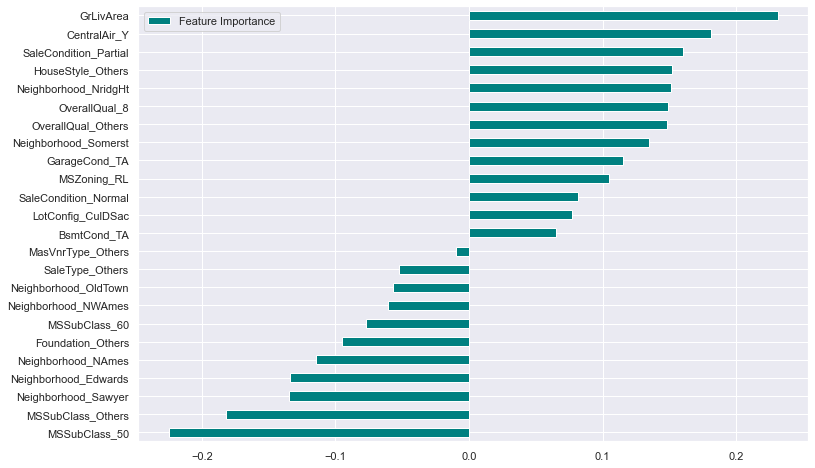

In [79]:
# Plot features by importance (feature coefficient in the model)
lasso_coefficients[lasso_coefficients['Feature Importance'] != 0].sort_values('Feature Importance').plot(kind='barh',
                                                                                           figsize=(12,8),color='teal')

In [80]:
final_pred = np.exp(np.concatenate((y_train_pred,y_test_pred)))

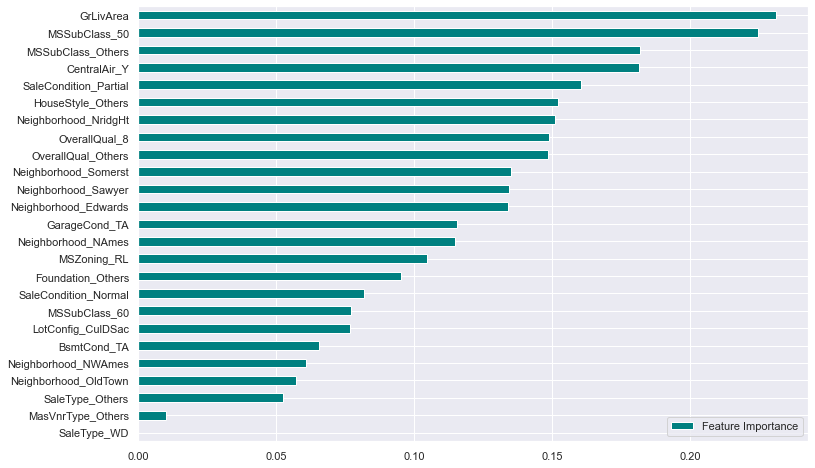

In [81]:
Copy_Of_lasso_Coeff=lasso_coefficients
lasso_coefficients.abs().sort_values('Feature Importance', ascending=True).plot(kind='barh',figsize=(12,8),color='teal')

## 5.4. Lasso vs Ridge

<Figure size 1800x1080 with 0 Axes>

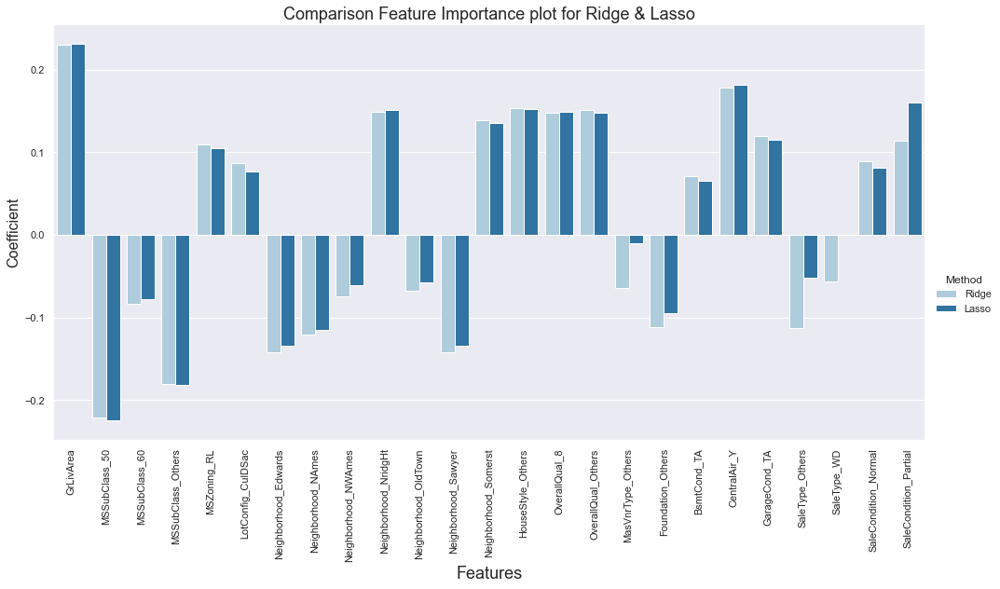

In [82]:
plt.figure(figsize=(25,15))
# add coefficients Method column for each dataframe
ridge_coefficients['Method'] = 'Ridge'
lasso_coefficients['Method'] = 'Lasso'
res=pd.concat([ridge_coefficients, lasso_coefficients])
res.reset_index(inplace=True)
res.sort_values('Feature Importance', ascending=False)
sns.set_palette("Paired")
sns.factorplot(data=res, hue='Method', x='index', y='Feature Importance', kind='bar', ci=None, aspect=2, size=7);
plt.xticks(rotation=90);
plt.title("Comparison Feature Importance plot for Ridge & Lasso", fontsize=18)
plt.xlabel('Features', fontsize=18)
plt.ylabel('Coefficient', fontsize=16)

plt.show();

We can see for few values of ridge we dont have Lasso values which means it had eleminated that feature

In [83]:
## Concating the value with initial dataframe
#The above Dataset has the value of both actual and predicted sales price which Business can 
#infer along with the important variables.
salespriceprediction= pd.DataFrame({'Id': HouseDf['Id'] ,'Pred_SalePrice': final_pred })
Final=pd.concat([Final,salespriceprediction], axis=1, join='inner')
Final.head()


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Id,Pred_SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500,1,96022.792695
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500,2,208102.079000
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500,3,151957.670951
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000,4,198752.351992
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000,5,131923.386285


## 6. Conclusion

The following are the optimal parameters of Ridge and Lasso respectively.

Rigde: 
- 'alpha': 6.0
- Ridge_R2_Train: 0.8292080946155551
- Ridge_R2_Test : 0.8062497691406121

Lasso:
- {'alpha': 0.001}
- Lasso_R2_Train: 0.8274983862362728
- Lasso_R2_Test : 0.8044082237912342

The R2 score of both ridge and Lasso are somewhat similar.
But we will chose Lasso as In the lasso, this makes it easier for the coefficients to be zero and therefore easier to eliminate some of the input variable as they are not contributing to the output.

In [84]:
Copy_Of_lasso_Coeff.sort_values(by='Feature Importance',ascending=False)

,Feature Importance,Method
GrLivArea,0.231095,Lasso
CentralAir_Y,0.181554,Lasso
SaleCondition_Partial,0.160297,Lasso
HouseStyle_Others,0.151907,Lasso
Neighborhood_NridgHt,0.151092,Lasso
OverallQual_8,0.148955,Lasso
OverallQual_Others,0.148296,Lasso
Neighborhood_Somerst,0.135135,Lasso
GarageCond_TA,0.115258,Lasso
MSZoning_RL,0.104698,Lasso


As per the model the ablove values are significant in (Decresing order) the price of a house.

Below is the breif summary of top 5 variables and how they describe the price of house 

Top 5 variables which influence te model are as follows .
- GrLivArea	
- CentralAir_Y	
- SaleCondition_Partial	
- HouseStyle_Others	
- Neighborhood_NridgHt	

Which means with incerease in the value of above 5 variables the sales price also increases.
In other words houses with Greater GrLivArea , CentralAir,SaleCondition_Partial,Housestyle_others and in the neighbourhood of Neighborhood_Nridght will have higher sales price

Top 5 variables which negatively affect the price
- MSSubClass_50
- MSSubClass_Others
- Neighborhood_Sawyer
- Neighborhood_Edwards
- Neighborhood_NAmes

the above mentioned neighbourhood with MSsubclass_50(1-STORY 1946 & NEWER ALL STYLES) and MsSubclass_others(i.e anything apart from 20,50,60,120) might lead to lesser saleprice of the house .


In [85]:
## Generic function to plot weight vs  alpha 
def weight_versus_alpha_plot(weight, alphas):
    """
    Pass in the estimated weight, the alpha value and the names
    for the features and plot the model's estimated coefficient weight 
    for different alpha values
    """
    fig = plt.figure(figsize = (8, 6))
    
    # ensure that the weight is an array
    weight = np.array(weight)
    for col in range(weight.shape[1]):
        plt.plot(alphas, weight[:, col])

    plt.axhline(0, color = 'black', linestyle = '--', linewidth = 3)
    
    # manually specify the coordinate of the legend
    plt.legend(bbox_to_anchor = (1.3, 0.9))
    plt.title('Coefficient Weight as Alpha Grows')
    plt.ylabel('Coefficient weight')
    plt.xlabel('alpha')
    return fig

## Question 1 .

What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

Answer: 
The following are the optimal alpha value for ridge and Lasso regression :


In [86]:
print("Ridge :",Ridge_Alpha)
print("Lasso :",Lasso_alpha)

Ridge : {'alpha': 6.0}
Lasso : {'alpha': 0.001}


#### Doubling the alpha value 

In [87]:
print("****New Ridge:",(Ridge_Alpha['alpha'] * 2)) 
alpha = (Ridge_Alpha['alpha'] * 2)
ridge_new = Ridge(alpha=alpha)

ridge_new.fit(X_train, y_train)
ridge_new.coef_

y_train_pred = ridge_new.predict(X_train)
Ridge_R2_Train_Double =r2_score(y_true=y_train, y_pred=y_train_pred)

y_test_pred = ridge_new.predict(X_test)
Ridge_R2_Test_Double= r2_score(y_true=y_test, y_pred=y_test_pred)
Ridge_R2_Train_Double
Ridge_R2_Test_Double

print("****Best Ridge :",(Ridge_Alpha['alpha'])) 
ridge.coef_
print("Ridge_R2_Train:",Ridge_R2_Train)
print("Ridge_R2_Test :",Ridge_R2_Test)

****New Ridge: 12.0


Ridge(alpha=12.0)

array([ 0.22984049, -0.20748762, -0.07214405, -0.1698515 ,  0.10571695,
        0.0825254 , -0.13212512, -0.11178751, -0.06508796,  0.14566952,
       -0.06842696, -0.12482807,  0.12854195,  0.13806802,  0.14690312,
        0.14122878, -0.05289908, -0.09803391,  0.07170445,  0.16873014,
        0.11837107, -0.09840508, -0.04744768,  0.0811038 ,  0.11825339])

0.826959563308685

0.8046367090466435

****Best Ridge : 6.0


array([ 0.23070132, -0.22046242, -0.08337824, -0.18031611,  0.10916297,
        0.08665453, -0.14149284, -0.12063854, -0.07484314,  0.14955021,
       -0.06797865, -0.14182138,  0.13840047,  0.15391857,  0.14767195,
        0.15162393, -0.06405571, -0.11202671,  0.0708196 ,  0.17782161,
        0.11962403, -0.11213092, -0.05623806,  0.08950852,  0.11370932])

Ridge_R2_Train: 0.8292080946155551
Ridge_R2_Test : 0.8062497691406121


In [88]:
Ridge_coefficients_new = pd.DataFrame({'Ridge Feature Importance New':ridge_new.coef_}, 
                           index=X_train.columns)
Ridge_coefficients_new.sort_values('Ridge Feature Importance New', ascending=False)

,Ridge Feature Importance New
GrLivArea,0.229840
CentralAir_Y,0.168730
OverallQual_8,0.146903
Neighborhood_NridgHt,0.145670
OverallQual_Others,0.141229
HouseStyle_Others,0.138068
Neighborhood_Somerst,0.128542
GarageCond_TA,0.118371
SaleCondition_Partial,0.118253
MSZoning_RL,0.105717


In [89]:
ridge_coefficients.sort_values('Feature Importance', ascending=False)

,Feature Importance,Method
GrLivArea,0.230701,Ridge
CentralAir_Y,0.177822,Ridge
HouseStyle_Others,0.153919,Ridge
OverallQual_Others,0.151624,Ridge
Neighborhood_NridgHt,0.149550,Ridge
OverallQual_8,0.147672,Ridge
Neighborhood_Somerst,0.138400,Ridge
GarageCond_TA,0.119624,Ridge
SaleCondition_Partial,0.113709,Ridge
MSZoning_RL,0.109163,Ridge


different alpha values: [1, 2, 3, 4, 6, 8, 10, 100]


Ridge(alpha=1)

Ridge(alpha=2)

Ridge(alpha=3)

Ridge(alpha=4)

Ridge(alpha=6)

Ridge(alpha=8)

Ridge(alpha=10)

Ridge(alpha=100)

No handles with labels found to put in legend.


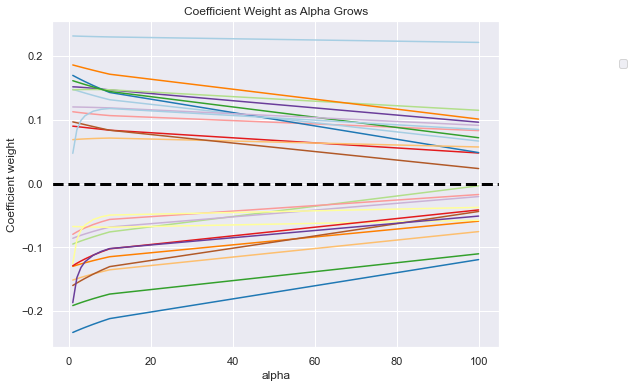

In [90]:
alphas = [1,2,3,4,6,8,10,100]
print('different alpha values:', alphas)

Ridge_weight = []
for alpha in alphas:    
    ridge_forPlot = Ridge(alpha = alpha, fit_intercept = True)
    ridge_forPlot.fit(X_train, y_train)
    Ridge_weight.append(ridge_forPlot.coef_)

lasso_fig = weight_versus_alpha_plot(Ridge_weight, alphas)

### Inferences
- With increase in alpha value the coefficients have reduced. (i.e they are shrinking towards 0 but doesnt become 0).

In [91]:
print("****New Lasso:",(Lasso_alpha['alpha'] * 2 )) 
lasso_new = Lasso(alpha=(Lasso_alpha['alpha'] * 2 ))
lasso_new.fit(X_train, y_train)
lasso_new.coef_

# Predict
y_train_pred = lasso_new.predict(X_train)
Lasso_R2_Train_Double = r2_score(y_true=y_train, y_pred=y_train_pred)

y_test_pred = lasso_new.predict(X_test)
Lasso_R2_Test_Double =r2_score(y_true=y_test, y_pred=y_test_pred)

Lasso_R2_Train_Double
Lasso_R2_Test_Double

print("****Best Lasso:",lasso.alpha) 
lasso.coef_
print("Lasso_R2_Train:",Lasso_R2_Train)
print("Lasso_R2_Test :",Lasso_R2_Test)

****New Lasso: 0.002


Lasso(alpha=0.002)

array([ 0.23056639, -0.21314761, -0.05729641, -0.17008439,  0.09585484,
        0.06350338, -0.11508384, -0.09623763, -0.03400889,  0.14860862,
       -0.04704945, -0.10084595,  0.11885007,  0.12945716,  0.1498428 ,
        0.13184501, -0.        , -0.05787391,  0.06288153,  0.17521491,
        0.11021065, -0.03943285, -0.        ,  0.06482096,  0.14935464])

0.821250822556749

0.7997651569956378

****Best Lasso: 0.001


array([ 0.23109476, -0.22466475, -0.07716763, -0.18159198,  0.10469802,
        0.07680192, -0.13399213, -0.11478324, -0.0606204 ,  0.15109205,
       -0.05721031, -0.13436748,  0.13513462,  0.15190742,  0.14895534,
        0.14829622, -0.00980404, -0.09514468,  0.06531927,  0.1815542 ,
        0.11525807, -0.05220999, -0.        ,  0.08176525,  0.16029652])

Lasso_R2_Train: 0.8274983862362728
Lasso_R2_Test : 0.8044082237912342


In [92]:
lasso_coefficients_new = pd.DataFrame({'Feature Importance New':lasso_new.coef_}, 
                           index=X_train.columns)
lasso_coefficients_new.sort_values('Feature Importance New', ascending=False)

,Feature Importance New
GrLivArea,0.230566
CentralAir_Y,0.175215
OverallQual_8,0.149843
SaleCondition_Partial,0.149355
Neighborhood_NridgHt,0.148609
OverallQual_Others,0.131845
HouseStyle_Others,0.129457
Neighborhood_Somerst,0.118850
GarageCond_TA,0.110211
MSZoning_RL,0.095855


In [93]:
Copy_Of_lasso_Coeff.sort_values(by='Feature Importance',ascending=False)

,Feature Importance,Method
GrLivArea,0.231095,Lasso
CentralAir_Y,0.181554,Lasso
SaleCondition_Partial,0.160297,Lasso
HouseStyle_Others,0.151907,Lasso
Neighborhood_NridgHt,0.151092,Lasso
OverallQual_8,0.148955,Lasso
OverallQual_Others,0.148296,Lasso
Neighborhood_Somerst,0.135135,Lasso
GarageCond_TA,0.115258,Lasso
MSZoning_RL,0.104698,Lasso


different alpha values: [0.0001, 0.001, 0.002, 1, 5, 8]


Lasso(alpha=0.0001)

Lasso(alpha=0.001)

Lasso(alpha=0.002)

Lasso(alpha=1)

Lasso(alpha=5)

Lasso(alpha=8)

No handles with labels found to put in legend.


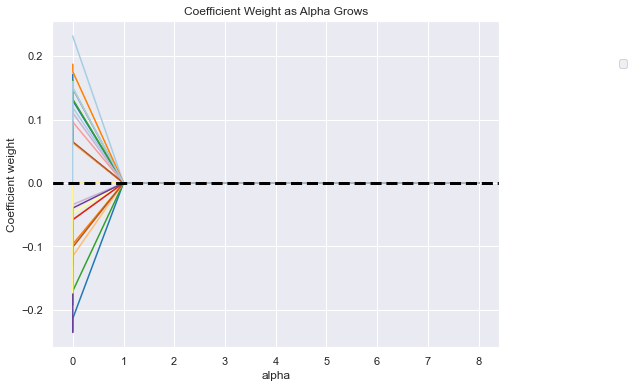

In [94]:
alphas = [0.0001, 0.001,0.002 ,1, 5, 8]
print('different alpha values:', alphas)

lasso_weight = []
for alpha in alphas:    
    lasso_forPlot = Lasso(alpha = alpha, fit_intercept = True)
    lasso_forPlot.fit(X_train, y_train)
    lasso_weight.append(lasso_forPlot.coef_)

lasso_fig = weight_versus_alpha_plot(lasso_weight, alphas)

### Inference
In case of Lasso when we doubled the alpha value we can observe that the coefficient values decreased .If we observe the Coefficients when alpha was 0.001 there was one coefficient which was 0. But when we increased the alpha to 0.002 we can see 2 coefficients which have become 0.From which we can conclude with increase in alpha the coefficients shrink towards zero.


## Question 2.
You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?

##### Answer:
After evaluating the model we got the following results 

In [95]:
print("Ridge_R2_Train:",Ridge_R2_Train)
print("Ridge_R2_Test :",Ridge_R2_Test)

Ridge_R2_Train: 0.8292080946155551
Ridge_R2_Test : 0.8062497691406121


In [96]:
print("Lasso_R2_Train:",Lasso_R2_Train)
print("Lasso_R2_Test :",Lasso_R2_Test)


Lasso_R2_Train: 0.8274983862362728
Lasso_R2_Test : 0.8044082237912342


The R2 score of both ridge and Lasso are somewhat similar.
But we will chose Lasso as In the lasso, this makes it easier for the coefficients to be zero(Lasso Regression adds “absolute value of magnitude” of coefficient as penalty term to the loss function) and therefore easier to eliminate some of the input variable as they are not contributing to the output(In other words it helps in feature selection).

## Question 3.

After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

In [97]:
## Inspecting the dataframe 
X_train.head()

,GrLivArea,MSSubClass_50,MSSubClass_60,MSSubClass_Others,MSZoning_RL,LotConfig_CulDSac,Neighborhood_Edwards,Neighborhood_NAmes,Neighborhood_NWAmes,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_Sawyer,Neighborhood_Somerst,HouseStyle_Others,OverallQual_8,OverallQual_Others,MasVnrType_Others,Foundation_Others,BsmtCond_TA,CentralAir_Y,GarageCond_TA,SaleType_Others,SaleType_WD,SaleCondition_Normal,SaleCondition_Partial
1153,-1.686831,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0
598,0.421193,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0
215,-0.442711,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0
135,0.484592,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0
816,-1.054497,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,1,1,0


In [98]:
## Lasso top 5
Top5= [ 'GrLivArea','CentralAir_Y','SaleCondition_Partial','HouseStyle_Others','Neighborhood_NridgHt']
Top5

['GrLivArea',
 'CentralAir_Y',
 'SaleCondition_Partial',
 'HouseStyle_Others',
 'Neighborhood_NridgHt']

In [99]:
X_train_new = X_train.drop(Top5, axis=1)
X_test_new=X_test.drop(Top5, axis=1)

In [100]:
lasso_3 = Lasso(alpha=Lasso_alpha['alpha'])
lasso_3.fit(X_train_new, y_train)

# Predict
y_train_pred_3 = lasso_3.predict(X_train_new)
lasso_3_R2_Train = r2_score(y_true=y_train, y_pred=y_train_pred)

y_test_pred_3 = lasso_3.predict(X_test_new)
lasso_3_R2_Test =r2_score(y_true=y_test, y_pred=y_test_pred)

lasso_3_R2_Train
lasso_3_R2_Test

Lasso(alpha=0.001)

0.821250822556749

0.7997651569956378

In [101]:
lasso_coefficients_3 = pd.DataFrame({'Feature Importance_3':lasso_3.coef_}, 
                           index=X_train_new.columns)
lasso_coefficients_3.sort_values('Feature Importance_3', ascending=False)

,Feature Importance_3
OverallQual_Others,0.333718
OverallQual_8,0.327383
GarageCond_TA,0.294146
MSZoning_RL,0.250584
Neighborhood_Somerst,0.170898
MSSubClass_60,0.148480
LotConfig_CulDSac,0.104085
BsmtCond_TA,0.087267
SaleCondition_Normal,0.081329
Neighborhood_NWAmes,-0.000000


#### Top 5 predictor variables are (overall  absolute value)
- OverallQual_Others
- OverallQual_8
- GarageCond_TA
- SaleType_Others
- SaleType_WD

#### positively affect  are 
- OverallQual_Others	
- OverallQual_8	
- GarageCond_TA	
- MSZoning_RL	
- Neighborhood_Somerst

#### Top 5 which negatively affect are 

- Neighborhood_NAmes	
- Neighborhood_Sawyer	
- Neighborhood_Edwards	
- SaleType_WD	
- SaleType_Others	



## Question 4.
How can you make sure that a model is robust and generalisable? What are the implications of the same for the accuracy of the model and why?

##### Answer is in the word Document 